### Importing the Libraries

In [1]:
#Imports for pre-processing of images and other utlity libraries
import random
import os
import shutil
from tqdm import tqdm
import matplotlib.pyplot as plt
import imageio
from PIL import Image
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix , classification_report , accuracy_score

#Import the deep learning libraries
from keras.preprocessing.image import ImageDataGenerator,load_img,img_to_array,array_to_img
from keras.applications.vgg19 import preprocess_input as preprocess_input_vgg19
from keras.applications.vgg16 import preprocess_input as preprocess_input_vgg16
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from keras.models import load_model
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K
from keras.optimizers import RMSprop, Adam
from keras.models import Model
from keras.callbacks import History
from keras.applications import vgg16, vgg19

### Download the dataset

In [2]:
#Download the Tiny Image Net dataset => http://cs231n.stanford.edu/tiny-imagenet-200.zip
!wget http://cs231n.stanford.edu/tiny-imagenet-200.zip

--2019-08-30 10:20:47--  http://cs231n.stanford.edu/tiny-imagenet-200.zip
Resolving cs231n.stanford.edu (cs231n.stanford.edu)... 171.64.68.10
Connecting to cs231n.stanford.edu (cs231n.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248100043 (237M) [application/zip]
Saving to: ‘tiny-imagenet-200.zip’

tiny-imagenet-200.z 100%[===================>] 236.61M  87.2MB/s    in 2.7s    

2019-08-30 10:20:50 (87.2 MB/s) - ‘tiny-imagenet-200.zip’ saved [248100043/248100043]



In [3]:
#Extract the dataset
!unzip tiny-imagenet-200.zip

Archive:  tiny-imagenet-200.zip
   creating: tiny-imagenet-200/
  inflating: tiny-imagenet-200/words.txt  
  inflating: tiny-imagenet-200/wnids.txt  
   creating: tiny-imagenet-200/test/
   creating: tiny-imagenet-200/test/images/
  inflating: tiny-imagenet-200/test/images/test_1860.JPEG  
  inflating: tiny-imagenet-200/test/images/test_613.JPEG  
  inflating: tiny-imagenet-200/test/images/test_6272.JPEG  
  inflating: tiny-imagenet-200/test/images/test_2289.JPEG  
  inflating: tiny-imagenet-200/test/images/test_3408.JPEG  
  inflating: tiny-imagenet-200/test/images/test_1693.JPEG  
  inflating: tiny-imagenet-200/test/images/test_389.JPEG  
  inflating: tiny-imagenet-200/test/images/test_2944.JPEG  
  inflating: tiny-imagenet-200/test/images/test_1275.JPEG  
  inflating: tiny-imagenet-200/test/images/test_8104.JPEG  
  inflating: tiny-imagenet-200/test/images/test_2351.JPEG  
  inflating: tiny-imagenet-200/test/images/test_678.JPEG  
  inflating: tiny-imagenet-200/test/images/test_3076

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  inflating: tiny-imagenet-200/train/n03179701/images/n03179701_152.JPEG  
  inflating: tiny-imagenet-200/train/n03179701/images/n03179701_239.JPEG  
  inflating: tiny-imagenet-200/train/n03179701/images/n03179701_55.JPEG  
  inflating: tiny-imagenet-200/train/n03179701/images/n03179701_397.JPEG  
 extracting: tiny-imagenet-200/train/n03179701/images/n03179701_497.JPEG  
  inflating: tiny-imagenet-200/train/n03179701/images/n03179701_130.JPEG  
  inflating: tiny-imagenet-200/train/n03179701/images/n03179701_78.JPEG  
  inflating: tiny-imagenet-200/train/n03179701/images/n03179701_305.JPEG  
  inflating: tiny-imagenet-200/train/n03179701/images/n03179701_206.JPEG  
  inflating: tiny-imagenet-200/train/n03179701/images/n03179701_51.JPEG  
  inflating: tiny-imagenet-200/train/n03179701/images/n03179701_370.JPEG  
  inflating: tiny-imagenet-200/train/n03179701/images/n03179701_360.JPEG  
  inflating: tiny-imagenet-200/train/n03179701/images/n03179701_69.JPEG  
  inflating: tiny-imagenet-2

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_27.JPEG  
  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_455.JPEG  
  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_26.JPEG  
  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_286.JPEG  
  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_280.JPEG  
  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_314.JPEG  
  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_174.JPEG  
  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_419.JPEG  
  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_331.JPEG  
  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_87.JPEG  
  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_209.JPEG  
  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_278.JPEG  
  inflating: tiny-imagenet-200/train/n01917289/images/n01917289_194.JPEG  
  inflating: tiny-imagenet-

In [4]:
!ls tiny-imagenet-200

test  train  val  wnids.txt  words.txt


### Data Prepration Stage 1: Taking first 500 images names from the first 40 classes.

In [5]:
#Taking first 500 images from each of the first 40 classes. Totalling 20000 images.
image_folders_ = os.listdir("tiny-imagenet-200/train/")[:40]
rand_image_paths_ = []
for folder in image_folders_:
    path = "tiny-imagenet-200/train/"+folder+"/images/"
    filenames_ = os.listdir(path)
    random_files_ = [path+name for name in filenames_[:500]]
    rand_image_paths_.extend(random_files_)

#Create folders if they don't exist
os.mkdir("raw_data") if not os.path.isdir("raw_data") else None
os.mkdir("raw_data/angle0") if not os.path.isdir("raw_data/angle0") else None
os.mkdir("raw_data/angle90") if not os.path.isdir("raw_data/angle90") else None
os.mkdir("raw_data/angle180") if not os.path.isdir("raw_data/angle180") else None
os.mkdir("raw_data/angle270") if not os.path.isdir("raw_data/angle270") else None

#Copy these 20000 files to the raw_data folder present at root
for image in tqdm(rand_image_paths_):
    shutil.copy(image,"raw_data/angle0/")

100%|██████████| 10000/10000 [00:00<00:00, 14231.42it/s]


### Utility functions for data pre-processing

In [6]:
def display_images(image_dir,filenames):
    """
    Utility function to display images 
    using Matplotlib.
    """
    plt.figure(figsize=(15,15))
    for i in range(1,len(filenames)):
        row = i
        image = Image.open(image_dir+filenames[i])
        plt.subplot(4,4,row)
        plt.imshow(image)
    plt.show()
    
def rotate_and_save(image_names,angle):
    """
    Utility function to rotate an image by 
    a certain degree and save them.
    """
    for filename in tqdm(image_names):
        image=Image.open(filename)
        if(angle==90):
            rotated=image.transpose(Image.ROTATE_90)
        elif(angle==180):
            rotated=image.transpose(Image.ROTATE_180)
        else:
            rotated=image.transpose(Image.ROTATE_270)
        rotated.save("raw_data/angle{}/".format(angle)+filename.split("/")[-1])

def create_split(source,destination,angle):
    """
    Split the data into train, validation and test dataset. 
    For each class 6500 for train, 2000 for validation, 1500 
    for test.
    """
    filenames=os.listdir("raw_data/angle0/")
    train_files = filenames[:6500]
    validation_files = filenames[6500:8500]
    test_files = filenames[8500:]

    train_files = [source+"angle{}/".format(angle)+i for i in train_files]
    for file in train_files:
        shutil.copy(file,destination+"/train/angle{}/".format(angle))         
    print("Train data created for Angle {} images...".format(angle))
    
    validation_files = [source+"angle{}/".format(angle)+i for i in validation_files]
    for file in validation_files:
        shutil.copy(file,destination+"/validation/angle{}/".format(angle))      
    print("Validation data created for Angle {} images...".format(angle))
    
    test_files = [source+"angle{}/".format(angle)+i for i in test_files]
    for file in test_files:
        shutil.copy(file,destination+"/test/angle{}/".format(angle))         
    print("Test data created for Angle {} images...\n".format(angle))

### Data preparation Stage 2: Generating images with rotations 90, 180 and 270 degree

In [7]:
names_0=["raw_data/angle0/"+filename for filename in os.listdir("raw_data/angle0/")]

#Rotate images by 90 degree and save them in folder data/angle90
rotate_and_save(names_0,90)

#Rotate images by 180 degree and save them in folder data/angle180
rotate_and_save(names_0,180)

#Rotate images by 270 degree and save them in folder data/angle270
rotate_and_save(names_0,270)

100%|██████████| 10000/10000 [00:05<00:00, 1929.56it/s]


### Data preparation Stage 3: Creating train, validation and test datasets

In [8]:
source="raw_data/"
destination="data/"

#We will check if the folder 'data','train','test','validation' exists. 
#If not, we will create a folder with the same name
os.mkdir(destination) if not os.path.isdir(destination) else None
os.mkdir(destination+"/train") if not os.path.isdir(destination+"/train") else None
os.mkdir(destination+"/validation") if not os.path.isdir(destination+"/validation") else None
os.mkdir(destination+"/test") if not os.path.isdir(destination+"/test") else None

#We will check if the folder 'angle0','angle90','angle180','angle270' exists. 
#If not, we will create a folder with the same name
os.mkdir(destination) if not os.path.isdir(destination) else None
os.mkdir(destination+"/train/angle0/") if not os.path.isdir(destination+"/train/angle0/") else None
os.mkdir(destination+"/validation/angle0/") if not os.path.isdir(destination+"/validation/angle0/") else None
os.mkdir(destination+"/test/angle0/") if not os.path.isdir(destination+"/test/angle0/") else None

os.mkdir(destination) if not os.path.isdir(destination) else None
os.mkdir(destination+"/train/angle90/") if not os.path.isdir(destination+"/train/angle90/") else None
os.mkdir(destination+"/validation/angle90/") if not os.path.isdir(destination+"/validation/angle90/") else None
os.mkdir(destination+"/test/angle90/") if not os.path.isdir(destination+"/test/angle90/") else None

os.mkdir(destination) if not os.path.isdir(destination) else None
os.mkdir(destination+"/train/angle180/") if not os.path.isdir(destination+"/train/angle180/") else None
os.mkdir(destination+"/validation/angle180/") if not os.path.isdir(destination+"/validation/angle180/") else None
os.mkdir(destination+"/test/angle180/") if not os.path.isdir(destination+"/test/angle180/") else None

os.mkdir(destination) if not os.path.isdir(destination) else None
os.mkdir(destination+"/train/angle270/") if not os.path.isdir(destination+"/train/angle270/") else None
os.mkdir(destination+"/validation/angle270/") if not os.path.isdir(destination+"/validation/angle270/") else None
os.mkdir(destination+"/test/angle270/") if not os.path.isdir(destination+"/test/angle270/") else None

In [9]:
#Create train, validation and test data using the helper function.
create_split(source,destination,0)
create_split(source,destination,90)
create_split(source,destination,180)
create_split(source,destination,270)

Train data created for Angle 0 images...
Validation data created for Angle 0 images...
Test data created for Angle 0 images...

Train data created for Angle 90 images...
Validation data created for Angle 90 images...
Test data created for Angle 90 images...

Train data created for Angle 180 images...
Validation data created for Angle 180 images...
Test data created for Angle 180 images...

Train data created for Angle 270 images...
Validation data created for Angle 270 images...
Test data created for Angle 270 images...



### Display images from the train set for all the 4 classes

In [10]:
filenames_ = os.listdir("data/train/angle0/")[:17]

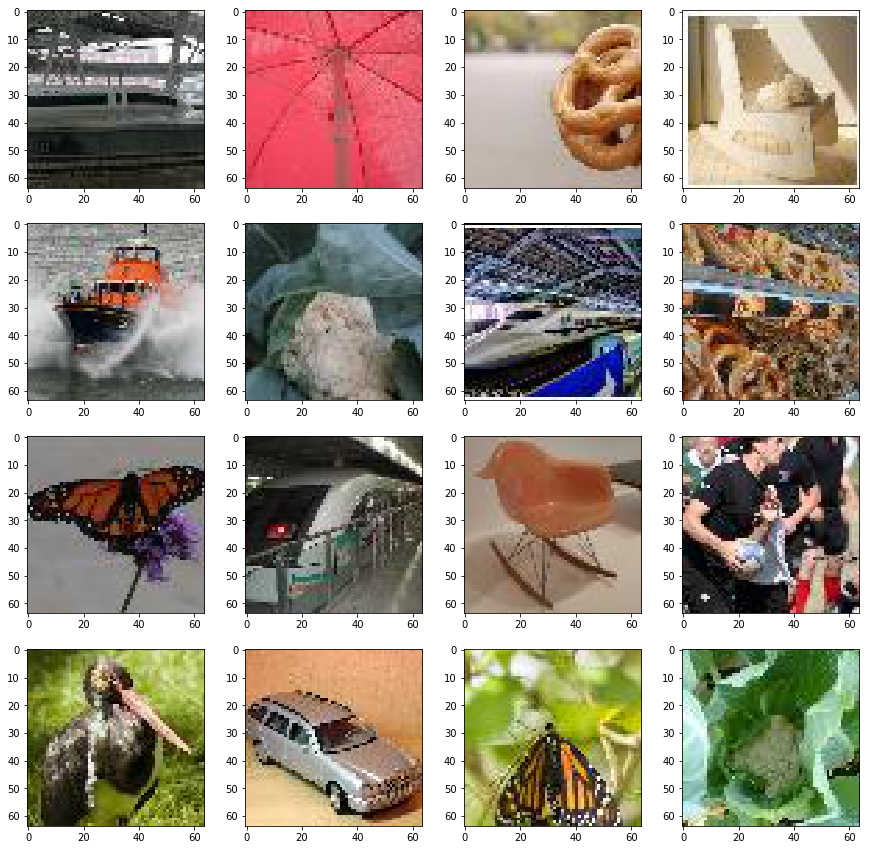

In [11]:
#Display some sample images from the 0 degree data 
image_dir = "data/train/angle0/"
display_images(image_dir,filenames_)

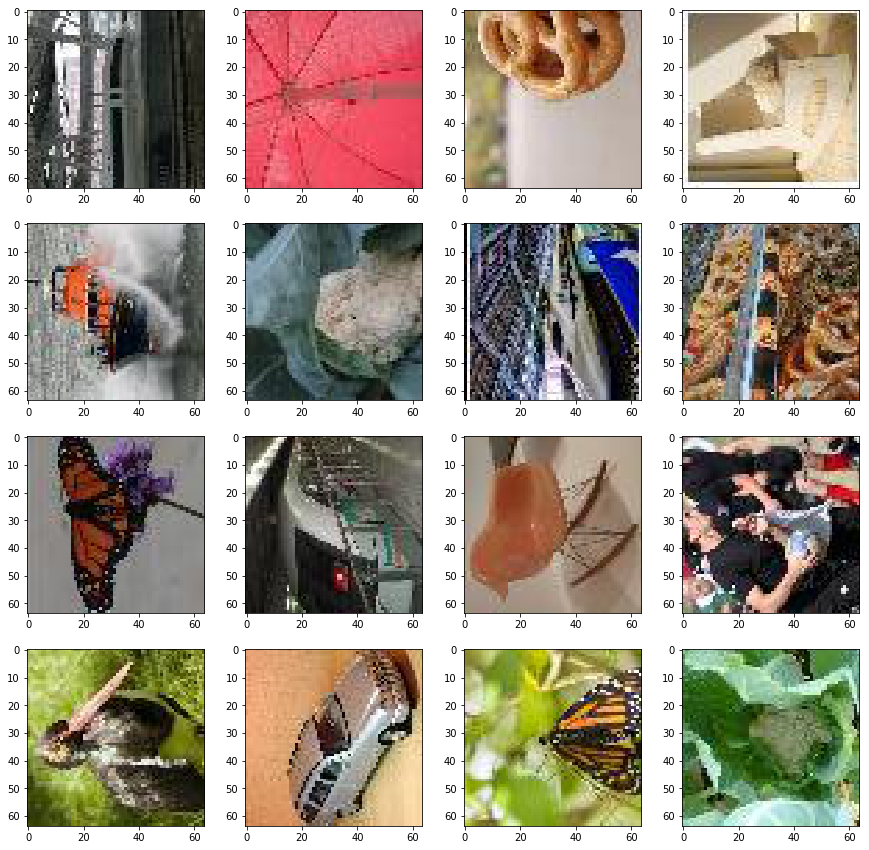

In [12]:
#Display some sample images from the 90 degree data 
image_dir = "data/train/angle90/"
display_images(image_dir,filenames_)

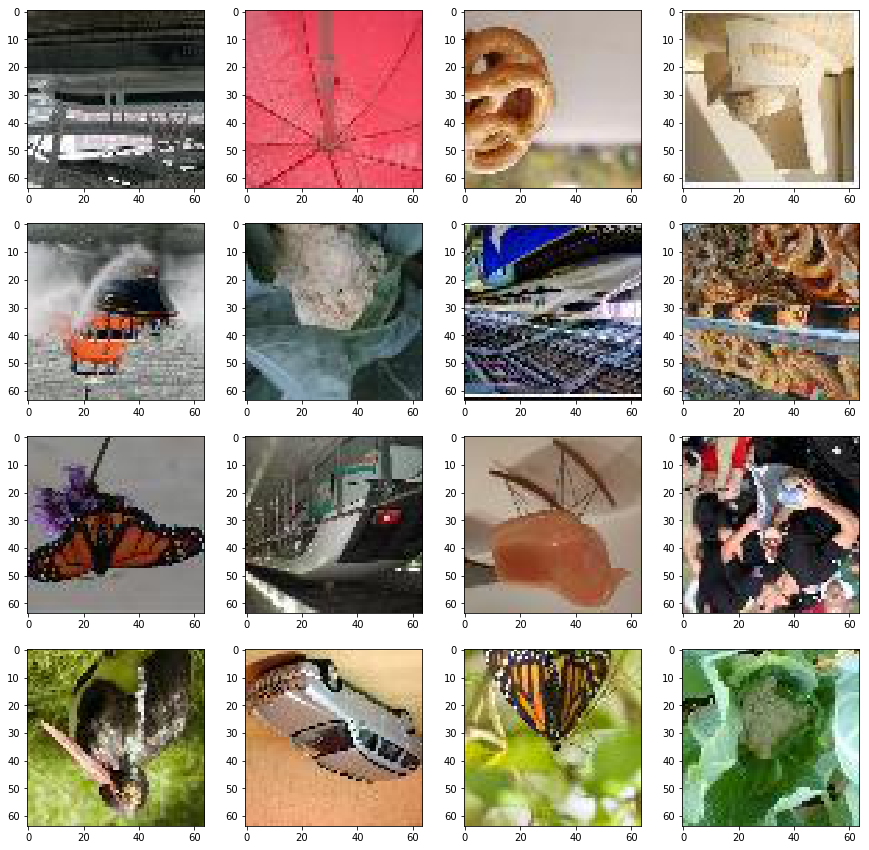

In [13]:
#Display some sample images from the 180 degree data 
image_dir = "data/train/angle180/"
display_images(image_dir,filenames_)

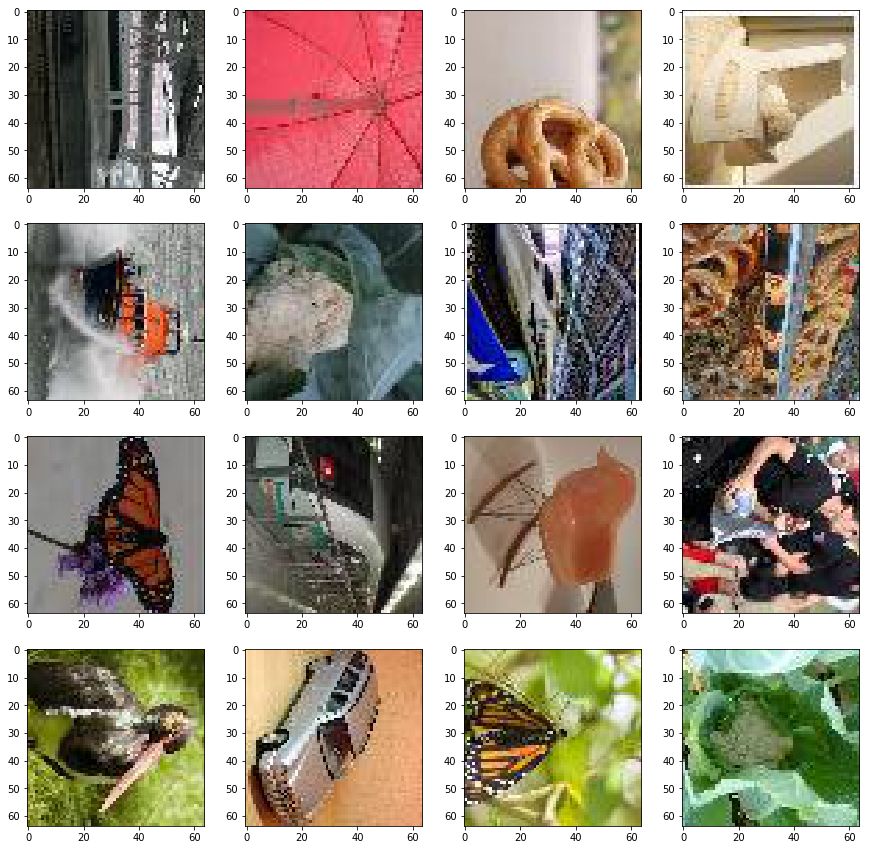

In [14]:
#Display some sample images from the 270 degree data 
image_dir = "data/train/angle270/"
display_images(image_dir,filenames_)

### Utility functions for the deep learning model

In [16]:
def plt_epoch_error(x, val_error, train_error, colors=['b']):
    """
    This function is used to plot the loss vs epoch for the
    trained models using the History callback.
    """
    plt.figure(figsize=(12,6))
    plt.grid()
    plt.plot(x, val_error, 'b', label="Validation Loss")
    plt.plot(x, train_error, 'r', label="Train Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Categorical Crossentropy Loss")
    plt.legend()
    
def plot_confusion_matrix(test_y, predict_y):
    """
    Given the ground truth and the predicted labels,
    this function is used to plot the confusion matrix,
    recall matrix and the precision matrix using seaborn
    heatmaps.
    """
    C = confusion_matrix(test_y, predict_y) #Confusion Matrix
    A =(((C.T)/(C.sum(axis=1))).T) #Recall Matrix
    B =(C/C.sum(axis=0)) #Precision Matrix
    
    plt.figure(figsize=(20,4))
    labels = [0,180,270,90]
    
    #Representing Confusion Matrix(C) in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    #Representing Precision Matrix(B) in heatmap format
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    #Representing Recall Matrix(B) in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

def angle_difference(x, y):
    """
    Calculate minimum difference between two angles.
    """
    return 180 - abs(abs(x - y) - 180)


#Custom loss function
def angle_error(y_true, y_pred):
    """
    Custom metric function to calculate the mean diference 
    between the true angles and the predicted angles. Each 
    angle is represented as a binary vector.
    """
    diff = angle_difference(K.argmax(y_true), K.argmax(y_pred))
    return K.mean(K.cast(K.abs(diff), K.floatx()))

### Model 1 => VGG19

#### Define the model architecture

In [17]:
#Model parameters
classes=4
epochs=25
batch_size=50

#Save the trained models to this folder
os.mkdir("trained_models/") if not os.path.isdir("trained_models/") else None

#ImageNet image dimensions
input_dim = (224, 224, 3)

#Load the Convolution base
vgg1 = vgg19.VGG19(weights='imagenet', include_top=False, input_shape=input_dim)

#Get the pre trained inputs
input_layer=vgg1.input

#Get the output of the final layer, flattent it and apply activation layer
x = vgg1.output
x = Flatten(name="flatten")(x)
output_layer = Dense(classes, activation='softmax', name='output_layer')(x)

#Create model
model = Model(inputs=input_layer, outputs=output_layer)

#Compile the final model
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(lr=0.00001, decay=1e-6),
              metrics=[angle_error])

#Display model summary
model.summary()

W0830 10:21:32.337500 139788420712192 deprecation_wrapper.py:119] From /usr/local/lib/python3.5/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0830 10:21:32.356979 139788420712192 deprecation_wrapper.py:119] From /usr/local/lib/python3.5/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0830 10:21:32.362738 139788420712192 deprecation_wrapper.py:119] From /usr/local/lib/python3.5/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0830 10:21:32.389193 139788420712192 deprecation_wrapper.py:119] From /usr/local/lib/python3.5/dist-packages/keras/backend/tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.

W0830 10:21:32.857817 139788420712192 deprecation_wrapp

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

#### Define custom callbacks

In [18]:
filepath="trained_models/"
checkpoint = ModelCheckpoint(filepath+"vgg19_weights.hdf5", 
                             monitor='val_angle_error', 
                             verbose=1, 
                             save_best_only=True, 
                             mode='min')

reduce_learning_rate = ReduceLROnPlateau(monitor='val_angle_error', patience=5)
early_stop = EarlyStopping(monitor='val_angle_error', patience=5)
history = History()

#### Train the model

In [19]:
#Normalize the images
train_datagen = ImageDataGenerator(rescale=1./255)

#Normalize the images
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory("data/train/",
                                                    target_size=(224, 224),
                                                    batch_size=batch_size,
                                                    class_mode='categorical')

validation_generator = val_datagen.flow_from_directory("data/validation/",
                                                       target_size=(224, 224),
                                                       batch_size=batch_size,
                                                       class_mode='categorical')

nb_train_samples = len(train_generator.classes)
nb_validation_samples = len(validation_generator.classes)

model.fit_generator(train_generator,
                    steps_per_epoch=nb_train_samples // batch_size,
                    epochs=epochs,
                    validation_data=validation_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    callbacks=[checkpoint,reduce_learning_rate,early_stop,history])

#Load the best weights and save the final model
model.load_weights(filepath+"vgg19_weights.hdf5")
model.save(filepath+"vgg19_model.h5")

Found 26000 images belonging to 4 classes.


W0830 10:21:36.521459 139788420712192 deprecation.py:323] From /usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Found 8000 images belonging to 4 classes.
Epoch 1/25
520/520 [==============================] - 165s 317ms/step - loss: 0.9859 - angle_error: 0.6569 - val_loss: 0.6908 - val_angle_error: 0.4201

Epoch 00001: val_angle_error improved from inf to 0.42012, saving model to trained_models/vgg19_weights.hdf5
Epoch 2/25
520/520 [==============================] - 158s 304ms/step - loss: 0.5702 - angle_error: 0.3352 - val_loss: 0.5588 - val_angle_error: 0.3101

Epoch 00002: val_angle_error improved from 0.42012 to 0.31013, saving model to trained_models/vgg19_weights.hdf5
Epoch 3/25
520/520 [==============================] - 158s 303ms/step - loss: 0.4188 - angle_error: 0.2347 - val_loss: 0.5221 - val_angle_error: 0.2908

Epoch 00003: val_angle_error improved from 0.31013 to 0.29075, saving model to trained_models/vgg19_weights.hdf5
Epoch 4/25
520/520 [==============================] - 157s 302ms/step - loss: 0.2959 - angle_error: 0.1603 - val_loss: 0.5430 - val_angle_error: 0.2824

Epoch 00004

#### Metric vs Epoch curve

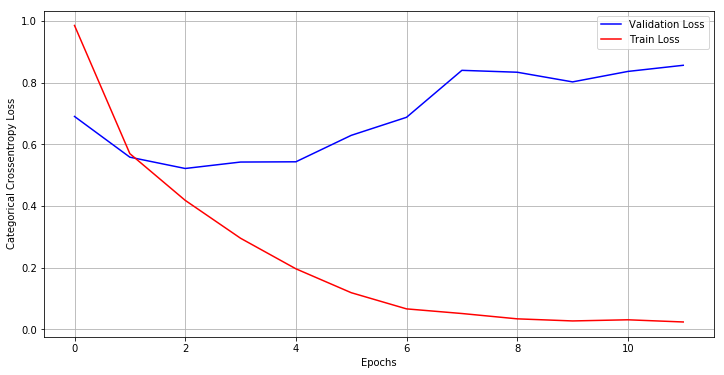

In [20]:
#List of epoch numbers
x = list(range(0,len(history.history['val_loss'])))

#Plot train vs test loss
val_error = history.history['val_loss'] 
train_error = history.history['loss'] 
plt_epoch_error(x, val_error, train_error)

#### Performance on unseen test images

100%|██████████| 6000/6000 [00:37<00:00, 160.23it/s]


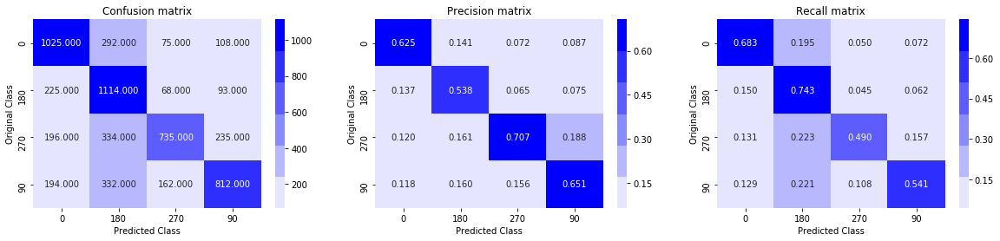

Classification report on test(unseen) data

              precision    recall  f1-score   support

      angle0       0.62      0.68      0.65      1500
    angle180       0.54      0.74      0.62      1500
    angle270       0.71      0.49      0.58      1500
     angle90       0.65      0.54      0.59      1500

    accuracy                           0.61      6000
   macro avg       0.63      0.61      0.61      6000
weighted avg       0.63      0.61      0.61      6000

Test accuracy on unseen data:  0.6143333333333333


In [21]:
models={}
models["vgg19"]=load_model(filepath+"vgg19_model.h5", custom_objects={'angle_error': angle_error})

def preprocessing_input(file, model=None):
    """
    This function is used to pre-process the test
    images before feeding it to the model for
    making predictions.
    """
    image = load_img(file, target_size=(224, 224))
    image = img_to_array(image)
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    if(model=="vgg19"):
        image = preprocess_input_vgg19(image)
    else:
        image = preprocess_input_vgg16(image)
    return image

#A dictionary mapping of the class labels to the folder names
int_to_class = {v:k for k,v in validation_generator.class_indices.items()}


files=[]
for folder in os.listdir("data/test/"):
    filenames = ["data/test/"+folder+"/"+name for name in os.listdir("data/test/"+folder)]
    files.extend(filenames)
    
y_true = []
y_pred = []
for file in tqdm(files):
    image = preprocessing_input(file, "vgg19")
    proba_prediction = models["vgg19"].predict(image)
    class_prediction = np.argmax(proba_prediction, axis= 1)
    y_true.append(file.split("/")[-2])
    y_pred.append(int_to_class[class_prediction[0]])
    
#Plot the confusion matrix, recall matrix and precision matrix
plot_confusion_matrix(y_true,y_pred)

#Get the classification report for this model
print("Classification report on test(unseen) data\n")
print(classification_report(y_true , y_pred))

#Get test accuracy on unseen data for this model
print("Test accuracy on unseen data: ",accuracy_score(y_true , y_pred))

#### Predicting on Single test images | We will take 4 random images from each of the 4 class from test data and predict the output

In [44]:
import re

def predict_single(file,model):
    """
    This function is used to load a single image,
    pre-process it and make predictions on the 
    single image. The regular expressions are used
    to extract only the digits from the class labels.
    """
    image = load_img(file, target_size=(224, 224))
    image = preprocessing_input(file, model)
    
    if(model=="vgg16"):
        proba_prediction = models["vgg16"].predict(image)
    else:
        proba_prediction = models["vgg19"].predict(image) 
        
    prediction = np.argmax(proba_prediction, axis= 1)
    actual = re.findall('\d+',file.split("/")[2])[0]
    pred = re.findall('\d+',int_to_class[prediction[0]])[0]
    inference = "Actual: {}".format(actual)+", Predicted: {}".format(pred)
    return inference

def display_predictions(filenames, model):
    """
    Utility function to display the test images and
    print the actual and predicted class labels
    in the image headers for each of the images.
    """
    plt.figure(figsize=(15,15))
    for i in range(1,len(filenames)):
        row = i
        image = Image.open(filenames[i])
        pred = predict_single(filenames[i],model)
        plt.subplot(4,4,row)
        plt.imshow(image)
        plt.title(pred)
    plt.show()

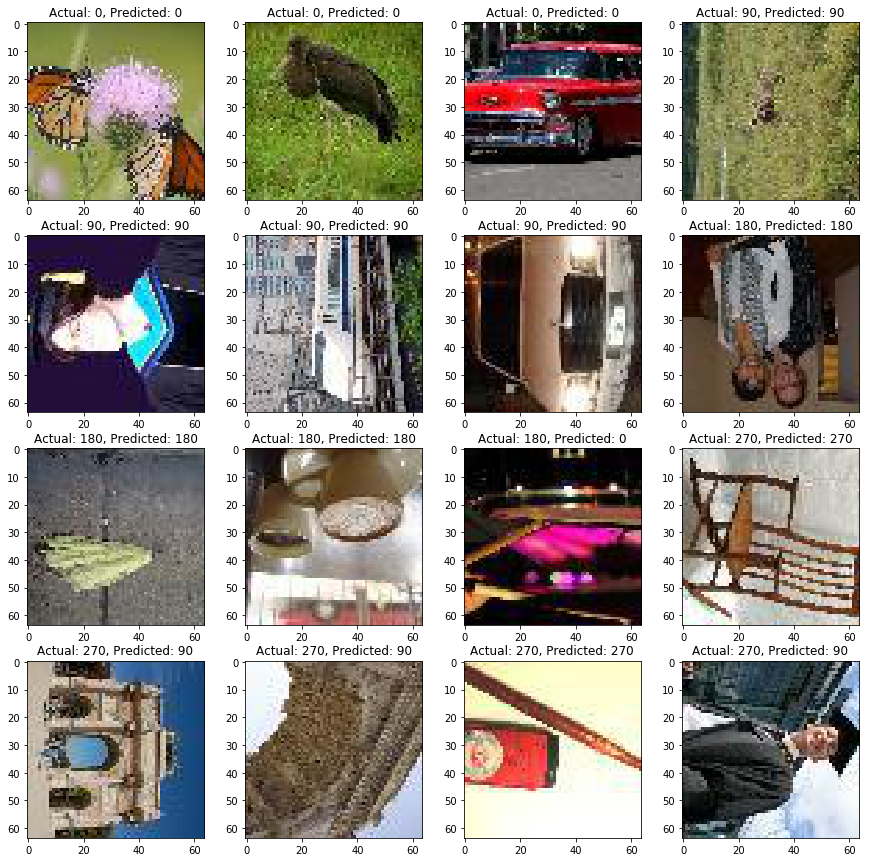

In [45]:
#At each run of this cell block, test images will be selected randomly.
angle0_files = ["data/test/angle0/"+i for i in random.sample(os.listdir("data/test/angle0/"),4)]
angle90_files = ["data/test/angle90/"+i for i in random.sample(os.listdir("data/test/angle90/"),4)]
angle180_files = ["data/test/angle180/"+i for i in random.sample(os.listdir("data/test/angle180/"),4)]
angle270_files = ["data/test/angle270/"+i for i in random.sample(os.listdir("data/test/angle270/"),5)]

#Concatenate all the file names for each classes into a single list.
all_files = angle0_files+angle90_files+angle180_files+angle270_files

#Display the test images in a plot with their actual and predicted class labels.
display_predictions(all_files, "vgg19")

### Model 2 => VGG16

#### Define the model architecture

In [32]:
#Model parameters
classes=4
epochs=25
batch_size=50

#ImageNet image dimensions
input_dim = (224, 224, 3)

#Load the Convolution base
vgg2 = vgg16.VGG16(weights='imagenet', include_top=False, input_shape=input_dim)

#Get the pre trained inputs
input_layer=vgg2.input

#Get the output of the final layer, flattent it and apply activation layer
x = vgg2.output
x = Flatten(name="flatten")(x)
output_layer = Dense(classes, activation='softmax', name='output_layer')(x)

#Create model
model = Model(inputs=input_layer, outputs=output_layer)

#Compile the final model
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(lr=0.0001, decay=1e-6),
              metrics=[angle_error])

#Display model summary
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

#### Define custom callbacks

In [33]:
#Define custom callbacks
filepath="trained_models/"
checkpoint = ModelCheckpoint(filepath+"vgg16_weights.hdf5", 
                             monitor='val_angle_error', 
                             verbose=1, 
                             save_best_only=True, 
                             mode='min')

reduce_learning_rate = ReduceLROnPlateau(monitor='val_angle_error', patience=5)
early_stop = EarlyStopping(monitor='val_angle_error', patience=5)
history = History()

#### Train the model

In [34]:
#Normalize the images
train_datagen = ImageDataGenerator(rescale=1./255)

#Normalize the images
val_datagen = ImageDataGenerator(rescale=1./255)


train_generator = train_datagen.flow_from_directory("data/train/",
                                                    target_size=(224, 224),
                                                    batch_size=batch_size,
                                                    class_mode='categorical')

validation_generator = val_datagen.flow_from_directory("data/validation/",
                                                       target_size=(224, 224),
                                                       batch_size=batch_size,
                                                       class_mode='categorical')

nb_train_samples = len(train_generator.classes)
nb_validation_samples = len(validation_generator.classes)

model.fit_generator(train_generator,
                    steps_per_epoch=nb_train_samples // batch_size,
                    epochs=epochs,
                    validation_data=validation_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    callbacks=[checkpoint,reduce_learning_rate,early_stop,history])

#Load the best weights and save the final model
model.load_weights(filepath+"vgg16_weights.hdf5")
model.save(filepath+"vgg16_model.h5")

Found 26000 images belonging to 4 classes.
Found 8000 images belonging to 4 classes.
Epoch 1/25
520/520 [==============================] - 136s 262ms/step - loss: 0.9681 - angle_error: 0.6392 - val_loss: 0.6585 - val_angle_error: 0.3649

Epoch 00001: val_angle_error improved from inf to 0.36488, saving model to trained_models/vgg16_weights.hdf5
Epoch 2/25
520/520 [==============================] - 134s 257ms/step - loss: 0.6010 - angle_error: 0.3351 - val_loss: 0.4913 - val_angle_error: 0.2573

Epoch 00002: val_angle_error improved from 0.36488 to 0.25725, saving model to trained_models/vgg16_weights.hdf5
Epoch 3/25
520/520 [==============================] - 134s 259ms/step - loss: 0.4527 - angle_error: 0.2379 - val_loss: 0.5574 - val_angle_error: 0.3171

Epoch 00003: val_angle_error did not improve from 0.25725
Epoch 4/25
520/520 [==============================] - 134s 257ms/step - loss: 0.3550 - angle_error: 0.1841 - val_loss: 0.5232 - val_angle_error: 0.2434

Epoch 00004: val_angle_

#### Metric vs Epoch curve

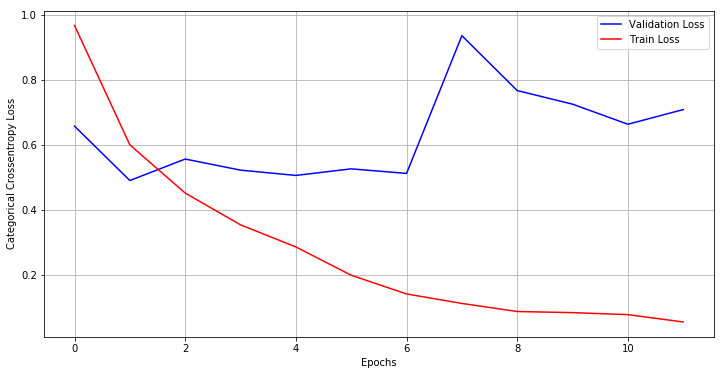

In [35]:
#List of epoch numbers
x = list(range(0,len(history.history['val_loss'])))

#Plot train vs test loss
val_error = history.history['val_loss'] 
train_error = history.history['loss'] 
plt_epoch_error(x, val_error, train_error)

#### Performance on unseen test images

100%|██████████| 6000/6000 [00:33<00:00, 180.40it/s]


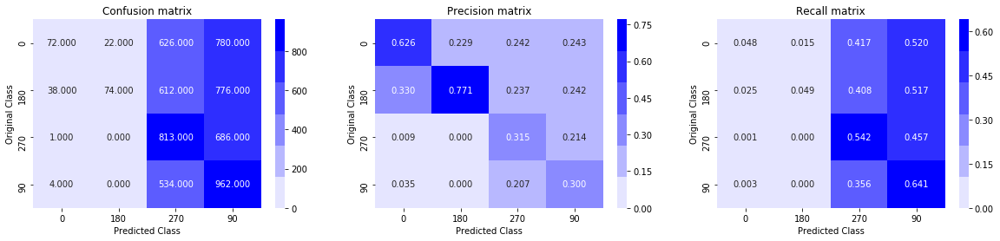

Classification report on test(unseen) data

              precision    recall  f1-score   support

      angle0       0.63      0.05      0.09      1500
    angle180       0.77      0.05      0.09      1500
    angle270       0.31      0.54      0.40      1500
     angle90       0.30      0.64      0.41      1500

    accuracy                           0.32      6000
   macro avg       0.50      0.32      0.25      6000
weighted avg       0.50      0.32      0.25      6000

Test accuracy on unseen data:  0.32016666666666665


In [36]:
models["vgg16"]=load_model(filepath+"vgg16_model.h5", custom_objects={'angle_error': angle_error})

files=[]
for folder in os.listdir("data/test/"):
    filenames = ["data/test/"+folder+"/"+name for name in os.listdir("data/test/"+folder)]
    files.extend(filenames)
    
y_true = []
y_pred = []
for file in tqdm(files):
    image = preprocessing_input(file, "vgg16")
    proba_prediction = models["vgg16"].predict(image)
    class_prediction = np.argmax(proba_prediction, axis= 1)
    y_true.append(file.split("/")[-2])
    y_pred.append(int_to_class[class_prediction[0]])
    
#Plot the confusion matrix, recall matrix and precision matrix
plot_confusion_matrix(y_true,y_pred)

#Get the classification report for this model
print("Classification report on test(unseen) data\n")
print(classification_report(y_true , y_pred))

#Get test accuracy on unseen data for this model
print("Test accuracy on unseen data: ",accuracy_score(y_true , y_pred))

#### Predicting on Single test images | We will take 4 random images from each of the 4 class from test data and predict the output

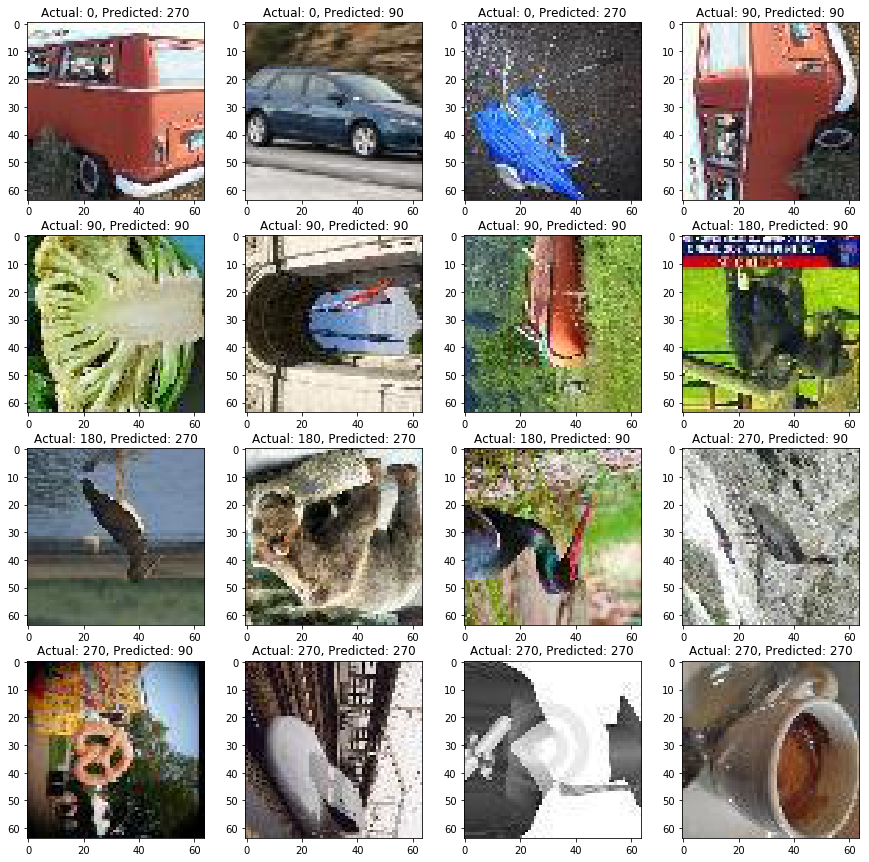

In [48]:
#At each run of this cell block, test images will be selected randomly.
angle0_files = ["data/test/angle0/"+i for i in random.sample(os.listdir("data/test/angle0/"),4)]
angle90_files = ["data/test/angle90/"+i for i in random.sample(os.listdir("data/test/angle90/"),4)]
angle180_files = ["data/test/angle180/"+i for i in random.sample(os.listdir("data/test/angle180/"),4)]
angle270_files = ["data/test/angle270/"+i for i in random.sample(os.listdir("data/test/angle270/"),5)]

#Concatenate all the file names for each classes into a single list.
all_files = angle0_files+angle90_files+angle180_files+angle270_files

#Display the test images in a plot with their actual and predicted class labels.
display_predictions(all_files, "vgg16")

In [ ]:
#scores = model.evaluate_generator(test_generator,steps=nb_test_samples//20)

In [ ]:
test_generator.class_indices

In [ ]:
models={}
models["vgg19"]=load_model(filepath+"vgg19_model.h5", custom_objects={'angle_error': angle_error})
models["vgg16"]=load_model(filepath+"vgg16_model.h5", custom_objects={'angle_error': angle_error})